# Exploratory Data Analysis

In this notebook, we will perform the following:
- Exploratory data analysis 

# 1. Import Libraries

In [166]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [167]:
import os
import opendatasets as od
from pathlib import Path
import pickle 

import pandas as pd
import numpy as np
import re
from geopy import distance
from geopy import Point

import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from src.utils import check_shape, highlight_top, missing_values_table, save_fig
from src.preprocessing import clean_property_type, clean_tenure, fill_missing_values, update_data, drop_columns, create_features

In [168]:
pd.set_option('display.max_columns', None)

# 2. Download Data

In [169]:
#od.download("https://www.kaggle.com/competitions/cs5228-2022-semester-1-final-project")

In [170]:
#os.rename('cs5228-2022-semester-1-final-project', 'raw_data')

# 3. Configurations

In [171]:
sns.set_theme(style="ticks")
sns.set_context("paper", rc={"xtick.labelsize":20,
                             "ytick.labelsize":20,
                             "axes.titlesize":20,
                             "axes.labelsize":20})
default_col = '#4c72b0'
highlight_col = '#c44d52'

In [172]:
# create a folder for plots
os.makedirs("images", exist_ok=True)

In [173]:
data_dir = Path("../raw_data/")
img_dir = Path("images/")

# 4. Exploratory Data Analysis

## 4.1 Summary Statistics

In [174]:
df_train = pd.read_csv(Path(data_dir, "train.csv"))
df_test = pd.read_csv(Path(data_dir, "test.csv"))
df_subzone = pd.read_csv(Path(data_dir, "auxiliary-data", "sg-subzones.csv"))
df_mrt = pd.read_csv(Path(data_dir, "auxiliary-data", "sg-mrt-stations.csv"))
df_shopping = pd.read_csv(Path(data_dir, "auxiliary-data","sg-shopping-malls.csv"))

In [175]:
df_train_cleaned = df_train.copy()

In [176]:
df_train_cleaned.head()

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb 4 rooms,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,NaN,116.0,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,"1, 2, 3, 4, 5, 6 br",NaN,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0
2,665422,4 bed condo for sale in meyerhouse,128 meyer road,meyerhouse,condo,freehold,2022.0,4.0,6.0,3070,low,partial,"studio, 3, 4, 5, 6 br",56.0,https://www.99.co/singapore/condos-apartments/...,1.298773,103.895798,0,mountbatten,marine parade,8485000.0
3,857699,3 bed condo for sale in leedon green,26 leedon heights,leedon green,Condo,freehold,2023.0,3.0,2.0,958,NaN,partial,"studio, 1, 2, 3, 4 br",638.0,https://www.99.co/singapore/condos-apartments/...,1.312364,103.803271,0,farrer court,bukit timah,2626000.0
4,216061,2 bed condo for sale in one bernam,1 bernam street,one bernam,condo,99-year leasehold,2026.0,2.0,1.0,732,NaN,unspecified,"studio, 1, 2, 3, 4, 5 br",351.0,https://www.99.co/singapore/condos-apartments/...,1.273959,103.843635,0,anson,downtown core,1764000.0


In [177]:
df_train_cleaned.dtypes

listing_id                int64
title                    object
address                  object
property_name            object
property_type            object
tenure                   object
built_year              float64
num_beds                float64
num_baths               float64
size_sqft                 int64
floor_level              object
furnishing               object
available_unit_types     object
total_num_units         float64
property_details_url     object
lat                     float64
lng                     float64
elevation                 int64
subzone                  object
planning_area            object
price                   float64
dtype: object

In [178]:
df_train_cleaned.describe()

,listing_id,built_year,num_beds,num_baths,size_sqft,total_num_units,lat,lng,elevation,price
count,20254.000000,19332.000000,20174.000000,19820.000000,2.025400e+04,14602.000000,20254.000000,20254.000000,20254.0,2.025400e+04
mean,550763.206428,2010.833695,3.122931,2.643542,1.854364e+03,376.253938,1.434282,103.855356,0.0,5.228263e+06
std,258874.420108,15.822803,1.281658,1.473835,1.354343e+04,346.882474,1.558472,3.593441,0.0,2.779748e+08
min,100043.000000,1963.000000,1.000000,1.000000,0.000000e+00,4.000000,1.239621,-77.065364,0.0,0.000000e+00
25%,326279.000000,2000.000000,2.000000,2.000000,8.070000e+02,106.000000,1.307329,103.806576,0.0,8.190000e+05
50%,551397.000000,2017.000000,3.000000,2.000000,1.119000e+03,296.000000,1.329266,103.841552,0.0,1.680000e+06
75%,774044.500000,2023.000000,4.000000,3.000000,1.528000e+03,561.000000,1.372461,103.881514,0.0,3.242400e+06
max,999944.000000,2028.000000,10.000000,10.000000,1.496000e+06,2612.000000,69.486768,121.023232,0.0,3.924243e+10


In [179]:
num_points, num_attributes = df_train_cleaned.shape
check_shape(df_train_cleaned)

There are 20254 data points and 21 features


From the summary statistics, we noticed that there are a couple of things off about this dataset.
- The minimum value of ``size_sqft`` and ``price`` is 0 which is not possible. Also, the maximum value for both feature are very far off from the 75th percentile which might be an indication of outlier. 
- The standard deviation of ``price`` is also very large which indicates that the prices vary widely.
- ``elevation`` has a mean of 0 and standard deviation of 0. This means that it is a constant feature and will not contribute in understanding the price

## 4.2 Univariate Analysis

### Target Variable

Saving figure boxplot_target


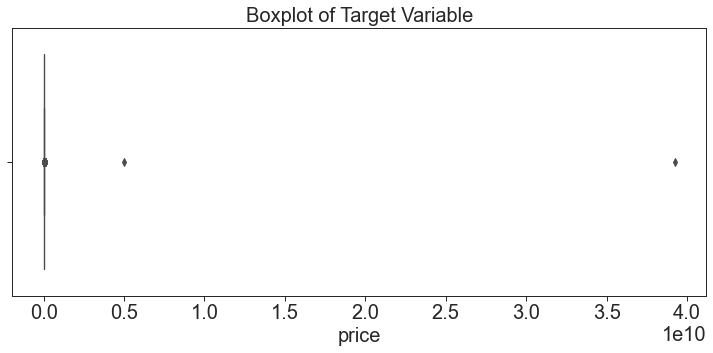

In [180]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["price"]).set_title("Boxplot of Target Variable")
save_fig("boxplot_target", img_dir)
plt.show()

- There are two extreme outliers. Let's look into the two outliers and see if they are indeed outliers

In [181]:
df_train_cleaned[df_train_cleaned["price"] > 0.4*10**10]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
5976,385586,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,232,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,3.924243e+10
16264,287109,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,129,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,4.985919e+09


In [182]:
df_train_cleaned[(df_train_cleaned["property_type"] == "hdb 4 rooms")]["price"].median()

627900.0

- We see both transactions are HDB 4 rooms. It is highly unlikely that a HDB will be able to fetch that high value.
- The median value is only 627900.0.
- There are 1 bedroom and 10 bathrooms which is impossible for a HDB
- We will remove the two outliers from our training dataset

In [183]:
df_train_cleaned = df_train_cleaned[df_train_cleaned["price"] <= 0.4*10**10].reset_index().drop("index",axis=1)

- We see that there are also 101 records with zero price. Since they contain no information about the target variable for our model training, we will remove them as well.

In [184]:
print(f'There are {df_train_cleaned[df_train_cleaned.price == 0].shape[0]} records with zero price before cleaning.')
df_train_cleaned = df_train_cleaned[df_train_cleaned["price"] > 0].reset_index().drop("index",axis=1)

There are 101 records with zero price before cleaning.


In [185]:
check_shape(df_train_cleaned)

There are 20151 data points and 21 features


Saving figure boxplot_target_clean


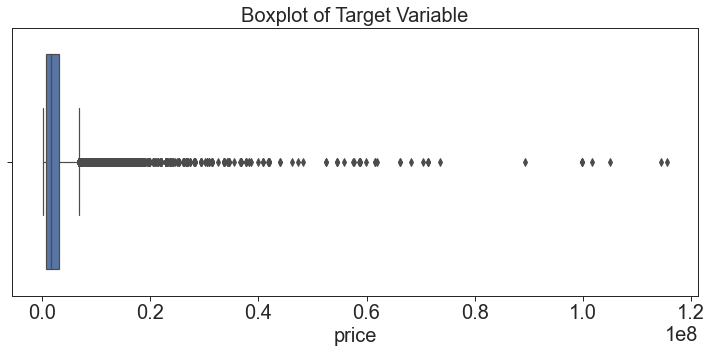

In [186]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["price"]).set_title("Boxplot of Target Variable")
save_fig("boxplot_target_clean", img_dir)
plt.show()

- The distribution of price is very skewed and could be an indicator of outliers. We will explore further in the bivaraite analysis section

Saving figure dist_target


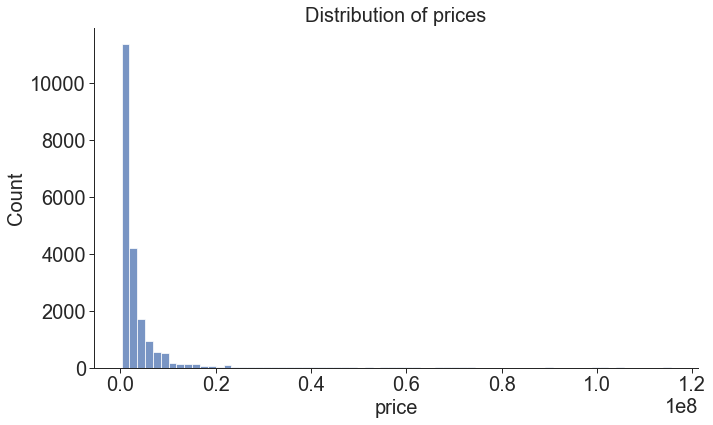

In [187]:
fig, ax = plt.subplots(figsize=(10,6))
sns.despine(fig)
ax = sns.histplot(df_train_cleaned["price"], 
             bins=70)
plt.title("Distribution of prices")
save_fig("dist_target", img_dir)
plt.show()


### Size Square Feet

Saving figure boxplot_size_sqft


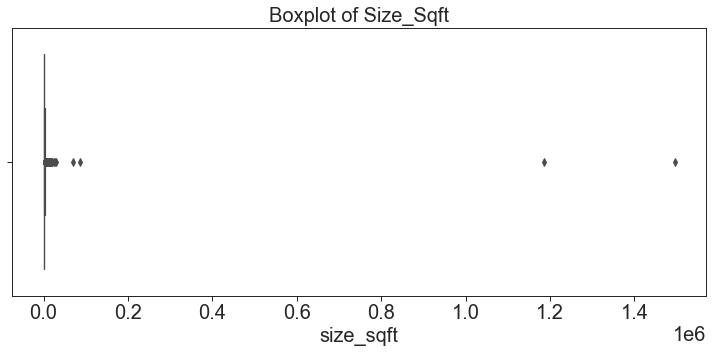

In [188]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["size_sqft"]).set_title("Boxplot of Size_Sqft")
save_fig("boxplot_size_sqft", img_dir)
plt.show()


- There are two extreme outliers. Let us look into these two outliers to determine if they are indeed outliers

In [189]:
df_train_cleaned[df_train_cleaned["size_sqft"] > 1*10**6]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
2686,160293,3 bed condo for sale in jlb residences,169 jalan loyang besar,jlb residences,condo,946-year leasehold,2008.0,3.0,2.0,1185000,NaN,unfurnished,3 br,36.0,https://www.99.co/singapore/condos-apartments/...,1.379105,103.960613,0,pasir ris park,pasir ris,1244200.0
18350,771950,4 bed condo for sale in avenue south residence,1 silat avenue,avenue south residence,condo,99-year leasehold,2023.0,4.0,4.0,1496000,NaN,unspecified,"studio, 1, 2, 3, 4 br",1074.0,https://www.99.co/singapore/condos-apartments/...,1.304855,103.773776,0,dover,queenstown,3040800.0


- Both of them are condo units. Let's try to see what is the average condo size.

In [190]:
df_train_cleaned[df_train_cleaned["property_type"] == "condo"]["size_sqft"].median()

969.0

- Both data points have the same property type and we see that the median ``size_sqft`` for condo is 969.0 
- This makes those two data points outliers since their ``size_sqft`` deviates too far away from the mean of a typical condo.
- Also, as seen earlier in the summary statistics, there are units with ``size_sqft`` == 0 which is not possible. We will remove those as well.

In [191]:
# remove the two outliers
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] <= 1*10**6].reset_index().drop("index",axis=1)

# remove data points with size_sfft == 0
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] != 0].reset_index().drop("index",axis=1)

In [192]:
check_shape(df_train_cleaned)

There are 20149 data points and 21 features


Saving figure boxplot_size_sqft_2


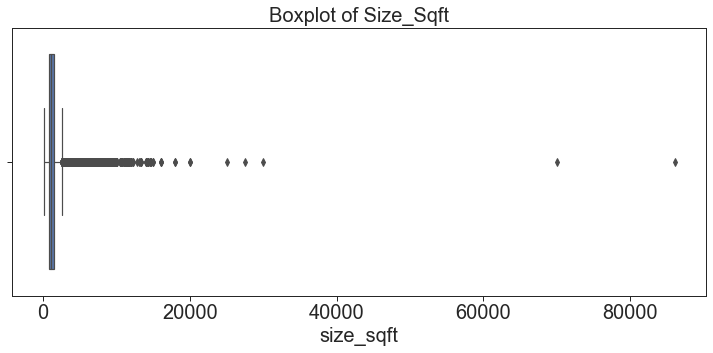

In [193]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["size_sqft"]).set_title("Boxplot of Size_Sqft")
save_fig("boxplot_size_sqft_2", img_dir)
plt.show()

In [194]:
# remove the two outliers
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] <= 40000].reset_index().drop("index",axis=1)

### Built Year

Saving figure dist_built_year


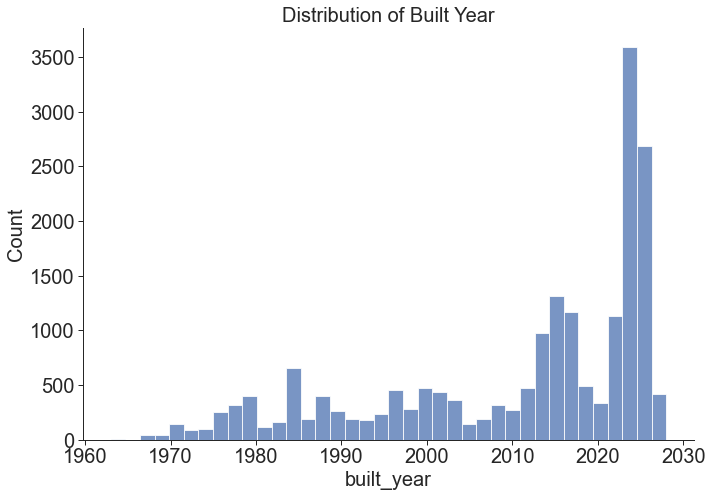

In [195]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["built_year"]).set_title("Distribution of Built Year")
save_fig("dist_built_year", img_dir)
plt.show()


- There are units with built_year beyond our current year 2022. However, since there are so many of those, it could be that those are the TOP year. This means that those units beyond 2022 are for future sales. We shall not remove those data

In [196]:
df_train_cleaned[df_train_cleaned["built_year"] > 2022]["built_year"].value_counts()

2023.0    2128
2025.0    1524
2024.0    1461
2026.0    1159
2027.0     381
2028.0      31
Name: built_year, dtype: int64

### Tenure

Saving figure count_tenure


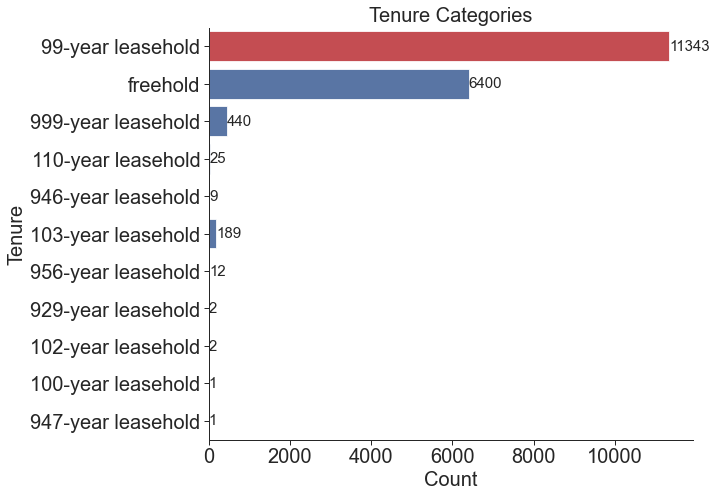

In [197]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="tenure", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Tenure Categories")
plt.xlabel("Count")
plt.ylabel("Tenure")
save_fig("count_tenure", img_dir)
plt.show()


- Since there are only a few instances for many of the categories, we can consider grouping them in our data preprocessing step. We will merge the 900+ leasehold with the 999 year leasehold. Those remaining 100+ leasehold will be merged with 99 year leasehold.

In [198]:
df_train_cleaned = clean_tenure(df_train_cleaned)

### Number of bedrooms

Saving figure count_bedroom


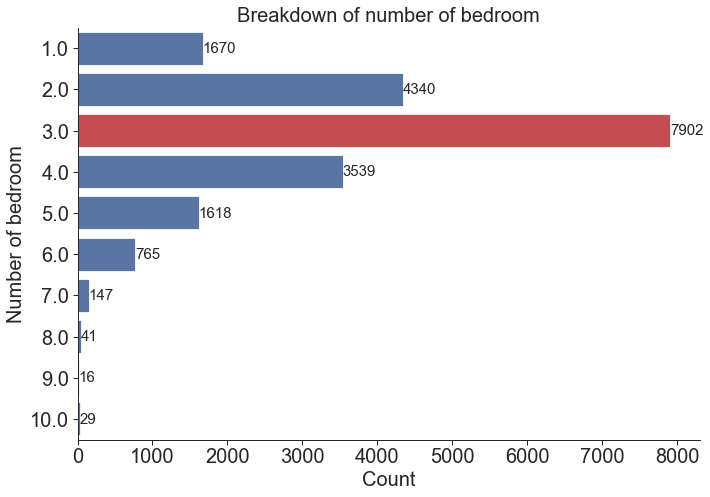

In [199]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_beds", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of number of bedroom")
plt.xlabel("Count")
plt.ylabel("Number of bedroom")
save_fig("count_bedroom", img_dir)
plt.show()

- Similarly, we could also consider binning this feature since there are some categories with few instances

### Number of Bathrooms

Saving figure count_bathroom


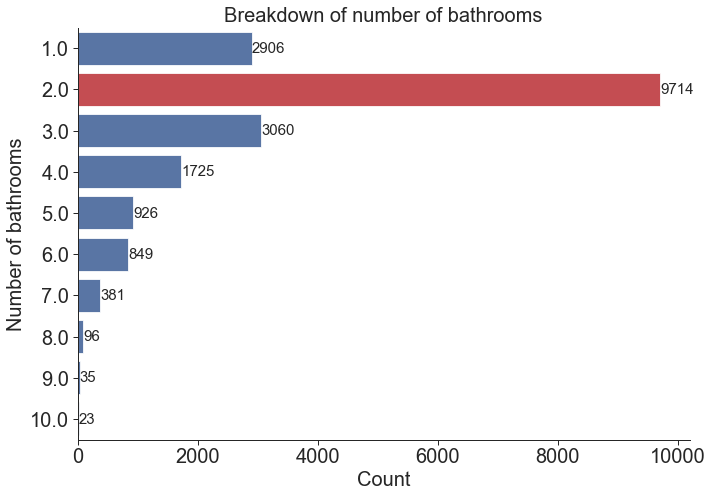

In [200]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_baths", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of number of bathrooms")
plt.xlabel("Count")
plt.ylabel("Number of bathrooms")
save_fig("count_bathroom", img_dir)
plt.show()


- Similarly, we could also consider binning this feature since there are some categories with few instances

### Property Type

- We have to normalize ``property_type``.
- For HDB, we can remove the number of rooms under the ``property_type`` since the information about number of rooms can be represented as ``size_sqft``
- There is only 1 shophouse instances and we know that *Shophouse* is under the broader category *Walk-Up* so we will replace this.
- We will perform this in our *preprocessing.py* file since we have to do it for both train and test set

In [201]:
df_train_cleaned = clean_property_type(df_train_cleaned)

Saving figure count_property_type


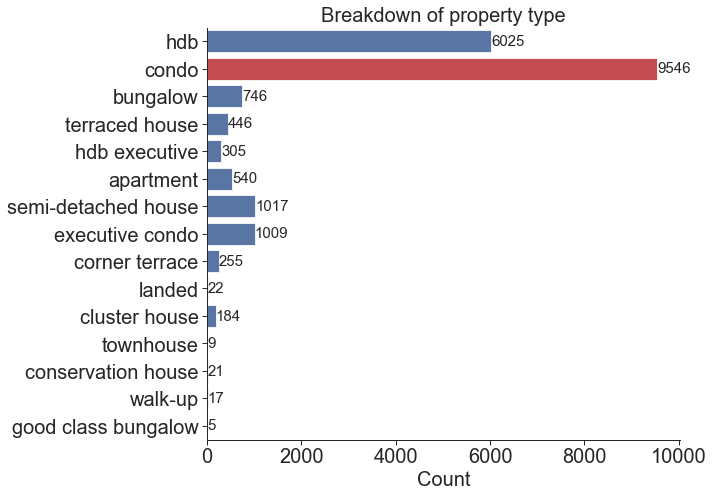

In [202]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="property_type", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of property type")
plt.xlabel("Count")
plt.ylabel("")
save_fig("count_property_type", img_dir)
plt.show()

### Latitude, Longitude

In [203]:
#create a map
this_map = folium.Map(prefer_canvas=True)

In [204]:
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''

    folium.CircleMarker(location=[point.lat, point.lng],
                        radius=2,
                        weight=5).add_to(this_map)

In [205]:
df_map = df_train_cleaned.loc[:,["lat", "lng"]]

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_map.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('images/map_lat_long.html')

this_map

- There seem to be 3 dirty coordinates.
- Singapore's latitude and longitude coordinates are (1.2902, 103.8519). We will identify which data points are very far off from the coordinates
- (69.486768, 20.184434) corresponds to the point located in Norway
- (38.942776, -77.065364) corresponds to the point located in USA
- (14.484814, 121.023232) corresponds to the point located in Philippines
- Let us look into these dirty coordinates

In [206]:
dirty_lat_long = df_train_cleaned[(df_train_cleaned["lng"] < 103) | (df_train_cleaned["lng"] >= 104)]
print("There are {} dirty coordinates".format(dirty_lat_long.shape[0]))

There are 113 dirty coordinates


- Further check revealed that there is most likely a typo in the coordinates as the address is a Singapore address.
- We will create a dictionary to update those dirty records

In [207]:
dirty_lat_long["address"].unique()

array(['1 tessensohn road', '15 farrer drive', '17 farrer drive',
       '38 lorong 32 geylang', '5 jalan mutiara'], dtype=object)

In [208]:
lat_update = {"1 tessensohn road": 1.3164313,
              "15 farrer drive": 1.317319,
              "17 farrer drive": 1.317319,
              "38 lorong 32 geylang": 1.311914,
              "5 jalan mutiara": 1.295539}

lng_update = {"1 tessensohn road": 103.8575321,
              "15 farrer drive": 103.807431,
              "17 farrer drive": 103.807431,
              "38 lorong 32 geylang": 103.886988,
              "5 jalan mutiara": 103.828318}

subzone_update = {"1 tessensohn road": "lavender",
                  "15 farrer drive": "holland road",
                  "17 farrer drive": "holland road",
                  "38 lorong 32 geylang": "macpherson",
                  "5 jalan mutiara": "nassim"}

planning_area_update = {"1 tessensohn road": "kallang",
                        "15 farrer drive": "bukit timah",
                        "17 farrer drive": "bukit timah",
                        "38 lorong 32 geylang": "geylang",
                        "5 jalan mutiara": "tanglin"}


In [209]:
for addr in lat_update.keys():
    df_train_cleaned["lat"] = np.where(df_train_cleaned["address"] == addr, lat_update[addr], df_train_cleaned["lat"] )
    df_train_cleaned["lng"] = np.where(df_train_cleaned["address"] == addr, lng_update[addr], df_train_cleaned["lng"] )

In [210]:
# save as dict
with open("../clean_data/dict_lat_update.pkl", "wb") as f:
    pickle.dump(lat_update, f)
with open("../clean_data/dict_lng_update.pkl", "wb") as f:
    pickle.dump(lng_update, f)
with open("../clean_data/dict_subzone_update.pkl", "wb") as f:
    pickle.dump(subzone_update, f)
with open("../clean_data/dict_planning_area_update.pkl", "wb") as f:
    pickle.dump(planning_area_update, f)


In [211]:
df_train_cleaned["subzone"] = df_train_cleaned["subzone"].fillna(df_train_cleaned["address"].map(subzone_update))
df_train_cleaned["planning_area"] = df_train_cleaned["planning_area"].fillna(df_train_cleaned["address"].map(planning_area_update))

In [212]:
check_shape(df_train_cleaned)

There are 20147 data points and 21 features


### Planning Area

Saving figure count_planning_area


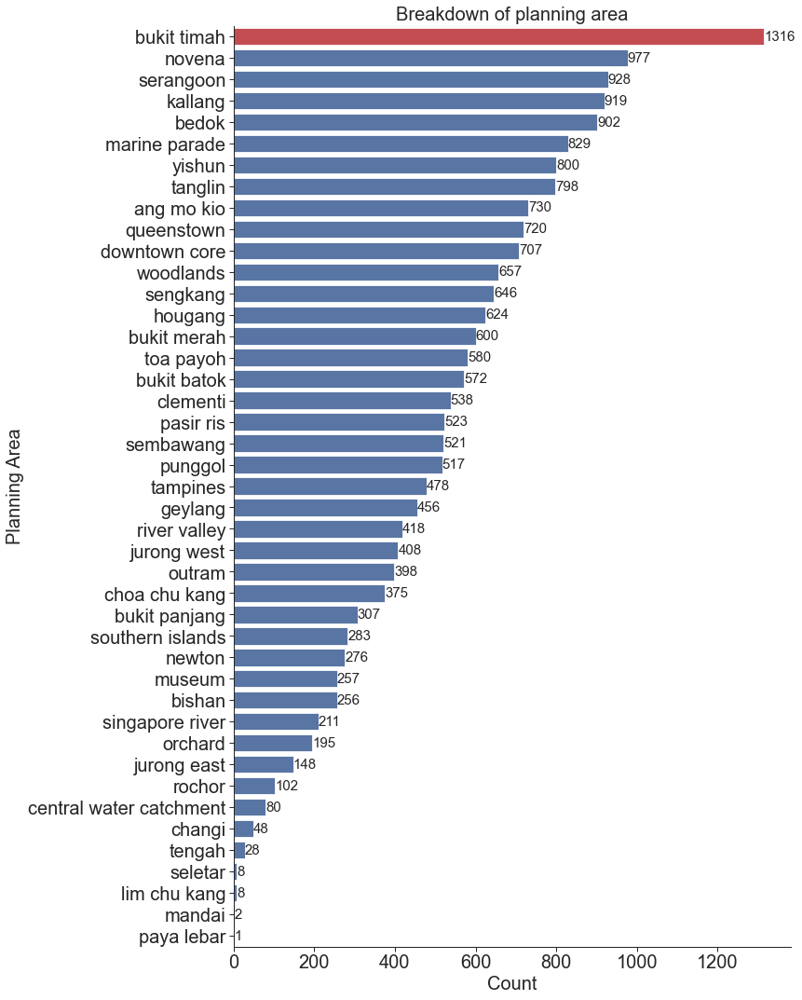

In [213]:
fig, ax = plt.subplots(figsize=(12,15))
ax = sns.countplot(y="planning_area", data=df_train_cleaned, color=default_col,
                   order = df_train_cleaned['planning_area'].value_counts().index)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of planning area")
plt.xlabel("Count")
plt.ylabel("Planning Area")
save_fig("count_planning_area", img_dir)
plt.show()


- Let's look at how price varies with the different planning area.
- We will look at the mean price of each planning area since it is difficult to visualise the disitrbution of so many planning areas

In [214]:
mean_price_area = df_train_cleaned.groupby(["planning_area"])["price"].mean().reset_index()
mean_price_area = mean_price_area.sort_values("price", ascending=False)
mean_price_area["price"] = mean_price_area["price"].apply(lambda x: x/1000000)
mean_price_area["price"] = round(mean_price_area["price"], 2)
mean_price_area = mean_price_area.rename(columns={"price": "price (in millions)"})

Saving figure planning_area_price


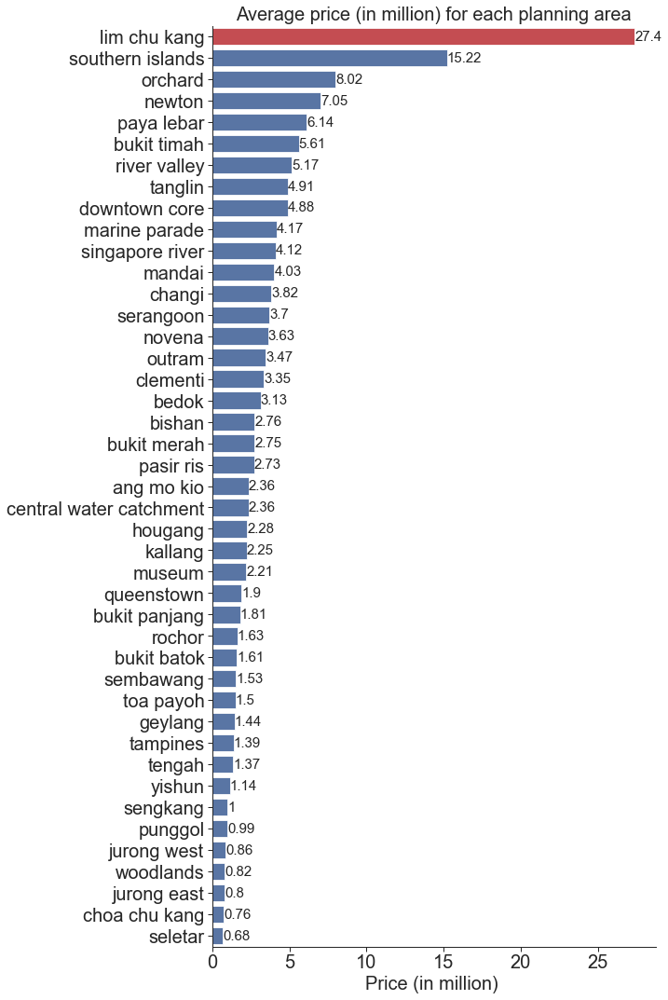

In [215]:
fig, ax = plt.subplots(figsize=(10,15))
sns.barplot(x="price (in millions)", y="planning_area", data=mean_price_area, label="Total", color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Average price (in million) for each planning area")
plt.xlabel("Price (in million) ")
plt.ylabel("")
save_fig("planning_area_price", img_dir)
plt.show()


- This feature will likely to be useful as there is a spectrum of prices across different planning area

### Furnishings

Saving figure count_furnishing


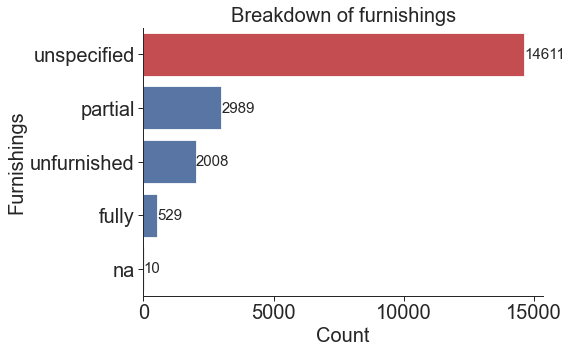

In [216]:
fig, ax = plt.subplots(figsize=(8,5))
ax = sns.countplot(y="furnishing", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of furnishings")
plt.xlabel("Count")
plt.ylabel("Furnishings")
save_fig("count_furnishing", img_dir)
plt.show()


### Total Number of Units

Saving figure dist_total_units


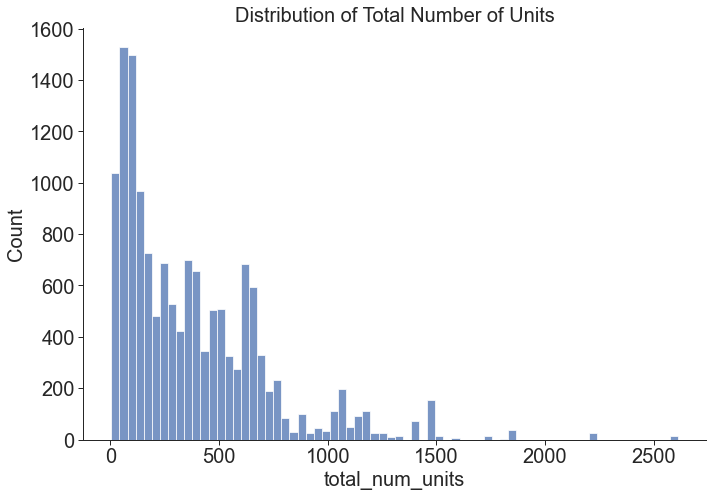

In [217]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["total_num_units"]).set_title("Distribution of Total Number of Units")
save_fig("dist_total_units", img_dir)
plt.show()


## 4.3 Bivariate Analysis

To identify potential outliers, we can look at two variables together.

### Relationship between size sqft and prices

Saving figure size_sqft_prices


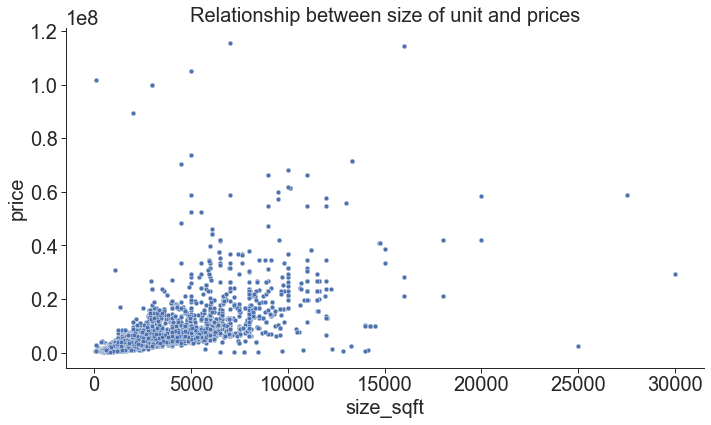

In [218]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices")
save_fig("size_sqft_prices", img_dir)
plt.show()


- In general, there is positive correlation between the size of unit and the resale price as we would expect. Thus, this should be a strong feature for our model.

- There are some points with near 0 size_sqft but fetched quite high price

In [219]:
outlier_size_price = df_train_cleaned[(df_train_cleaned["price"] >0.8*10**8) & ((df_train_cleaned["size_sqft"] < 500))]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_size_price.index)].reset_index().drop("index", axis=1)

- There are three points which are quite far away

In [220]:
outlier_size_price_1 = df_train_cleaned[(df_train_cleaned["size_sqft"] >23000)]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_size_price_1.index)].reset_index().drop("index", axis=1)

Saving figure size_sqft_prices_clean


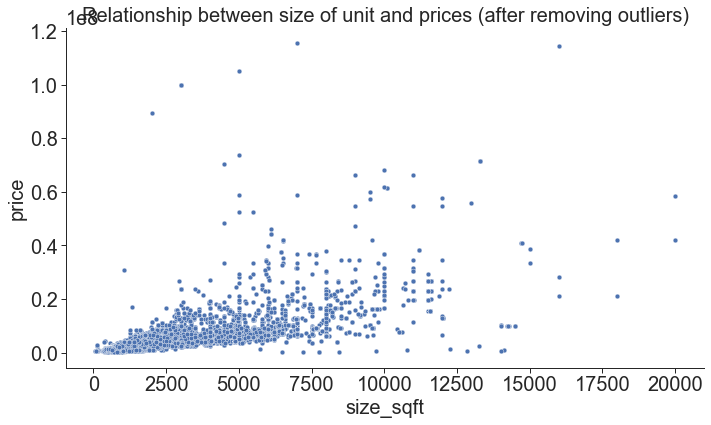

In [221]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices (after removing outliers)")
save_fig("size_sqft_prices_clean", img_dir)
plt.show()

### Relationship between Size and Number of bedrooms

- Since the number of bedrooms should have a positive relationship with the size sqft, we can identify potential outliers

Saving figure size_sqft_beds


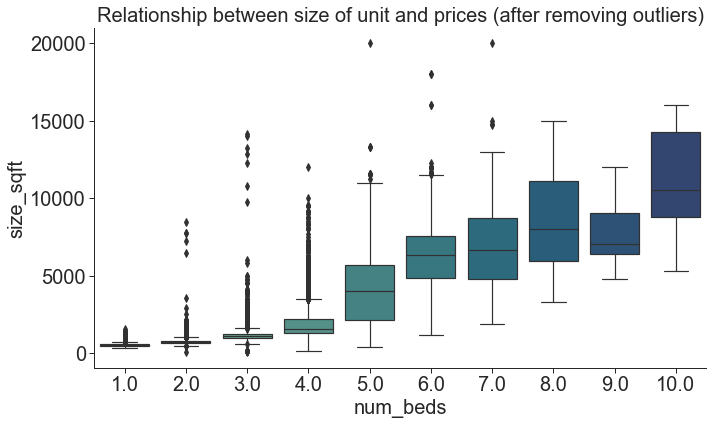

In [222]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.boxplot(x="num_beds", y="size_sqft",
                data=df_train_cleaned, ax=ax, palette="crest")
plt.title("Relationship between size of unit and prices (after removing outliers)")
save_fig("size_sqft_beds", img_dir)
plt.show()

- Since a typical 2 room HDB flat would have be at least 400 size_sqft, any records with lesser than 400 can be considered dirty

In [223]:
outlier_size_bed = df_train_cleaned[(df_train_cleaned["num_beds"] >= 2) & (df_train_cleaned["size_sqft"] <500)]

In [224]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_size_bed.index)].reset_index().drop("index", axis=1)

Saving figure size_sqft_beds_clean


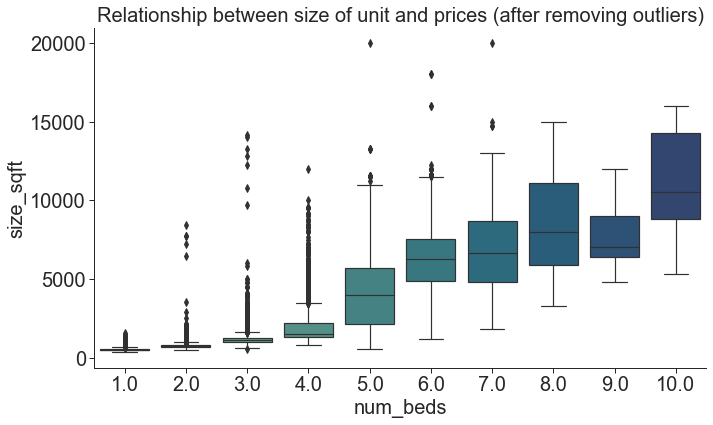

In [225]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.boxplot(x="num_beds", y="size_sqft",
                data=df_train_cleaned, ax=ax, palette="crest")
plt.title("Relationship between size of unit and prices (after removing outliers)")
save_fig("size_sqft_beds_clean", img_dir)
plt.show()

### Relationship between Size and Property Type

- We have seen that size of unit is a strong feature. Let's explore further and see how size and property type are related

Saving figure size_sqft_property


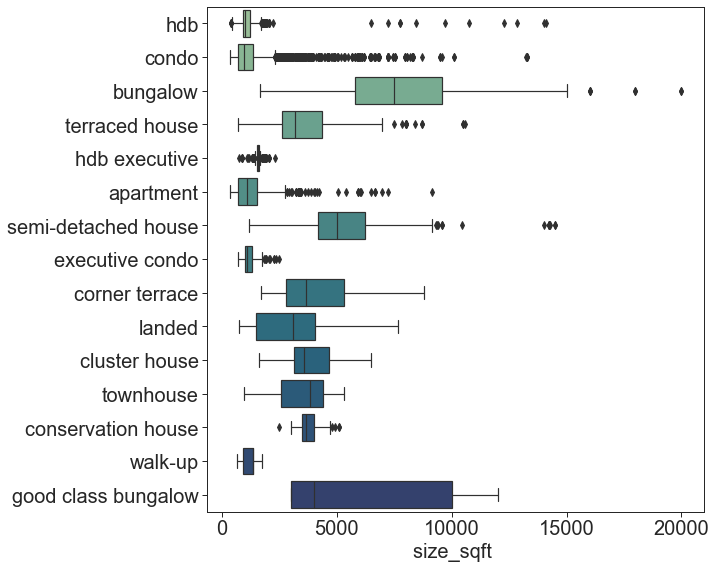

In [226]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="size_sqft", y="property_type", data=df_train_cleaned, palette="crest")
plt.xlabel("size_sqft ")
plt.ylabel("")
save_fig("size_sqft_property", img_dir)
plt.show()


- It is not likely that a HDB can have above 7000 size_sqft or below 300 size_sqft
- There is cluster house unit with near 0 size_sqft

In [227]:
# outlier_hdb_size = df_train_cleaned[(df_train_cleaned["property_type"] == "hdb") & (df_train_cleaned["size_sqft"] > 5000)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_hdb_size.index)].reset_index().drop("index", axis=1)

- There is an outlier in condo

In [228]:
outlier_condo_size = df_train_cleaned[(df_train_cleaned["property_type"] == "condo") & (df_train_cleaned["size_sqft"] > 12000)]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_condo_size.index)].reset_index().drop("index", axis=1)

Saving figure size_sqft_property_clean


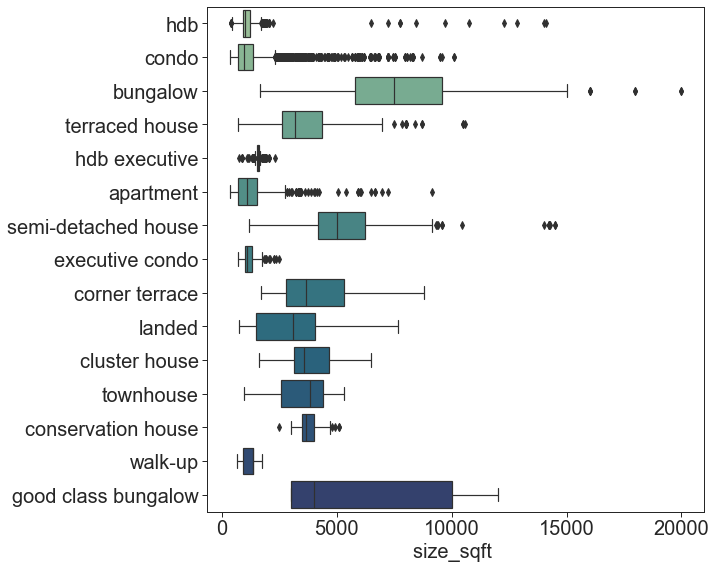

In [229]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="size_sqft", y="property_type", data=df_train_cleaned, palette="crest")
plt.xlabel("size_sqft ")
plt.ylabel("")
save_fig("size_sqft_property_clean", img_dir)
plt.show()

- It seems like a terraced house unit with 25K size_sqft unit is quite an outlier. Let's take a closer look

In [230]:
# dirty_terrace_sizesqft = df_train_cleaned[(df_train_cleaned["property_type"] == "terraced house") & (df_train_cleaned["size_sqft"] > 10000)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_terrace_sizesqft.index)].reset_index().drop("index",axis=1)

In [231]:
# outlier_condo_size = df_train_cleaned[(df_train_cleaned["property_type"] == "condo") & (df_train_cleaned["size_sqft"] >12500)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_condo_size.index)].reset_index().drop("index", axis=1)

In [232]:
# dirty_semid_sizesqft = df_train_cleaned[(df_train_cleaned["property_type"] == "semi-detached house") & (df_train_cleaned["size_sqft"] > 12000)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_semid_sizesqft.index)].reset_index().drop("index", axis=1)

In [233]:
# outlier_apartment_size = df_train_cleaned[(df_train_cleaned["property_type"] == "apartment") & (df_train_cleaned["size_sqft"] >8000)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_apartment_size.index)].reset_index().drop("index", axis=1)

### Relationship between Tenure and Prices

Saving figure tenure_price


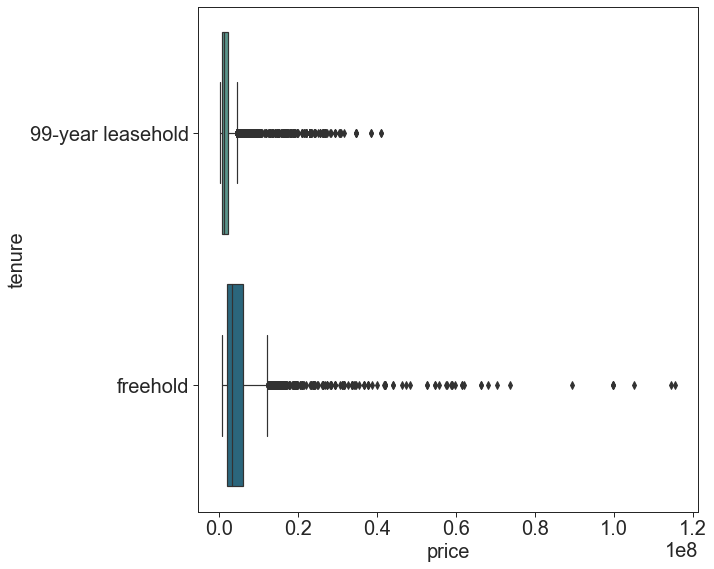

In [234]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="price", y="tenure", data=df_train_cleaned, palette="crest")
save_fig("tenure_price", img_dir)
plt.show()


In [235]:
# outlier_freehold = df_train_cleaned[(df_train_cleaned["tenure"] == "freehold") & (df_train_cleaned["price"] > 1*10**8)]
# df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_freehold.index)].reset_index().drop("index", axis=1)

### Relationship between number of bedrooms and prices

Saving figure bedroom_price


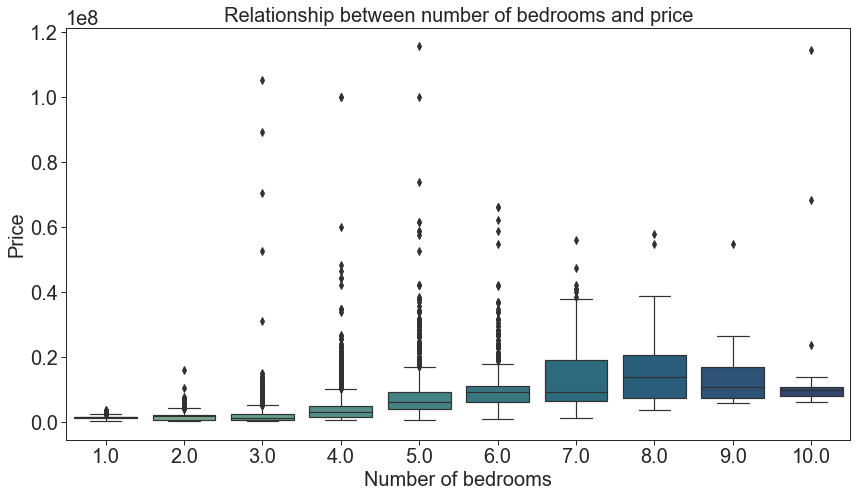

In [236]:
fig, ax = plt.subplots(figsize=(12,7))
sns.boxplot(x="num_beds", y="price", data=df_train_cleaned, palette="crest")
ax.set_xlabel("Number of bedrooms")
ax.set_ylabel("Price")
ax.set_title("Relationship between number of bedrooms and price")
save_fig("bedroom_price", img_dir)
plt.show()


- As the number of bedrooms increases, the higher the resale price. As there is clear pattern, this feature would surely be very useful for our model prediction
- We noticed there are some points that are very far from the rest. Eg: 4 bedrooms and 9 bedrooms

In [237]:
outlier_num_beds = df_train_cleaned[(df_train_cleaned["num_beds"] == 9) & (df_train_cleaned["price"] > 5*10**7)]
outlier_num_beds

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
18398,266715,9 bed house for sale in brizay park,wilby road,brizay park,bungalow,NaN,NaN,9.0,10.0,12000,NaN,unspecified,"3, 4, 5, 6, 7, 8, 9, 10 br",NaN,https://www.99.co/singapore/houses/brizay-park...,1.331176,103.787244,0,holland road,bukit timah,54600000.0


In [238]:
outlier_num_beds_2 = df_train_cleaned[(df_train_cleaned["num_beds"] == 4) & (df_train_cleaned["price"] > 0.8*10**8)]
outlier_num_beds_2

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
15309,968693,4 bed house for sale in the glencaird residences,dalvey road,the glencaird residences,good class bungalow,freehold,2000.0,4.0,4.0,3000,NaN,unfurnished,"3, 4, 5, 6 br",12.0,https://www.99.co/singapore/houses/the-glencai...,1.315477,103.819725,0,nassim,tanglin,99750000.0
18824,622818,4 bed house for sale in the glencaird residences,dalvey road,the glencaird residences,bungalow,freehold,2000.0,4.0,4.0,3000,NaN,unspecified,"3, 4, 5, 6 br",12.0,https://www.99.co/singapore/houses/the-glencai...,1.315477,103.819725,0,nassim,tanglin,99750000.0


In [239]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_num_beds.index)]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_num_beds_2.index)].reset_index().drop("index", axis=1)

### Built Year and Price

- There are some really old units. Let's look further

Saving figure built_year_price


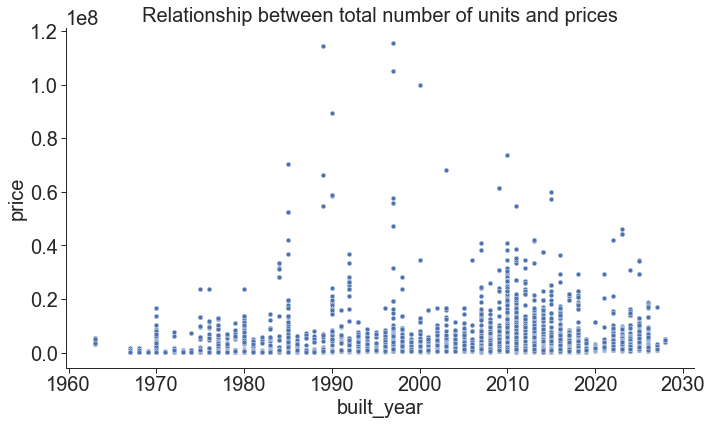

In [240]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="built_year", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between total number of units and prices")
save_fig("built_year_price", img_dir)
plt.show()


### Relationship between number of bedrooms and bathrooms

In [241]:
bed_baths_count = df_train_cleaned.groupby(["num_beds", "num_baths"]).size().reset_index()
bed_baths_count.columns.values[bed_baths_count.columns == 0] = 'count'

In [242]:
# Compute a size variable for the markers so that they have a good size regardless
# of the total count and the number of unique values in each categorical variable
scale = 60*bed_baths_count['count'].size
size = bed_baths_count['count']/bed_baths_count['count'].sum()*scale

Saving figure num_baths_beds


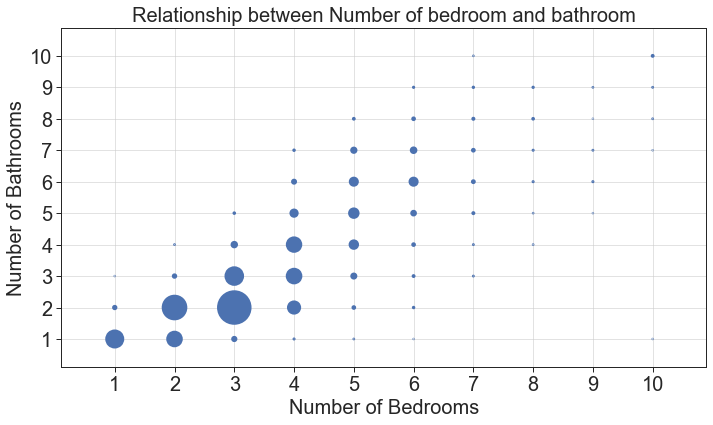

In [243]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter("num_beds", "num_baths", size, data=bed_baths_count, 
           zorder=2, linewidth=2)
ax.grid(linestyle='-', alpha=0.7, zorder=1)
ax.tick_params(length=5)
ax.set_frame_on(True)
plt.xticks([1,2,3,4,5,6,7,8,9,10])
plt.xlabel("Number of Bedrooms")
plt.yticks([1,2,3,4,5,6,7,8,9,10])
plt.ylabel("Number of Bathrooms")
plt.title("Relationship between Number of bedroom and bathroom")
ax.margins(0.1)
save_fig("num_baths_beds", img_dir)
plt.show()


- Since the number of bedrooms is positively correlated to the number of bathrooms. We could use this pattern to identify outliers. Those with a big difference between the number of bedrooms and number of bathrooms

In [244]:
df_train_temp = df_train_cleaned.copy()

In [245]:
df_train_temp["diff_beds_baths"] = df_train_temp["num_beds"] - df_train_temp["num_baths"]

In [246]:
df_train_temp['diff_beds_baths'].value_counts()

 1.0    8607
 0.0    8328
-1.0    1115
 2.0    1106
-2.0     300
 3.0      76
-3.0      39
 4.0      21
 5.0       1
 9.0       1
Name: diff_beds_baths, dtype: int64

In [247]:
outlier_diff_beds_baths = df_train_temp[df_train_temp["diff_beds_baths"] >= 5]
outlier_diff_beds_baths

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,diff_beds_baths
6380,898989,6 bed house for sale in the carrara,mountbatten road,the carrara,semi-detached house,freehold,2025.0,6.0,1.0,6376,NaN,unspecified,"studio, 4, 5, 6, 7 br",6.0,https://www.99.co/singapore/houses/the-carrara...,1.300620,103.892783,0,mountbatten,marine parade,9834300.0,5.0
9999,504907,10 bed house for sale in raffles park,oriole crescent,raffles park,bungalow,freehold,1992.0,10.0,1.0,12000,NaN,unspecified,"studio, 4, 5, 6, 7, 8, 9, 10 br",NaN,https://www.99.co/singapore/houses/raffles-par...,1.284235,103.851485,0,raffles place,downtown core,23625000.0,9.0


In [248]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(outlier_diff_beds_baths.index)].reset_index().drop("index", axis=1)

Saving figure bath_beds_property


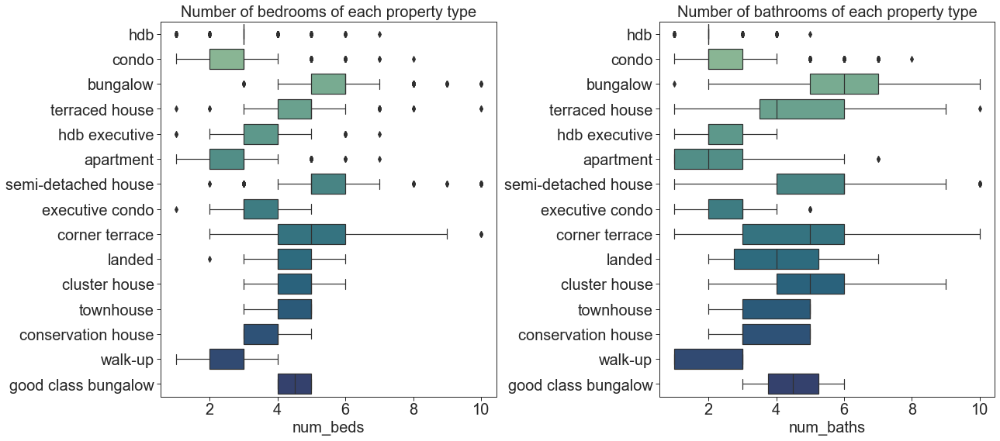

In [249]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
sns.boxplot(x="num_beds", y="property_type", data=df_train_cleaned, ax=ax1, palette="crest")
ax1.set_title('Number of bedrooms of each property type')
ax1.set_ylabel('')
sns.boxplot(x="num_baths", y="property_type", data=df_train_cleaned, ax=ax2, palette="crest")
ax2.set_title('Number of bathrooms of each property type')
ax2.set_ylabel('')
plt.tight_layout()
save_fig("bath_beds_property", img_dir)
plt.show()


- Since the number of bedrooms and bathrooms vary for the different property type, we could perhaps use this information when filling in any missing values.

### Furnishings and Prices

Saving figure furnishing_price


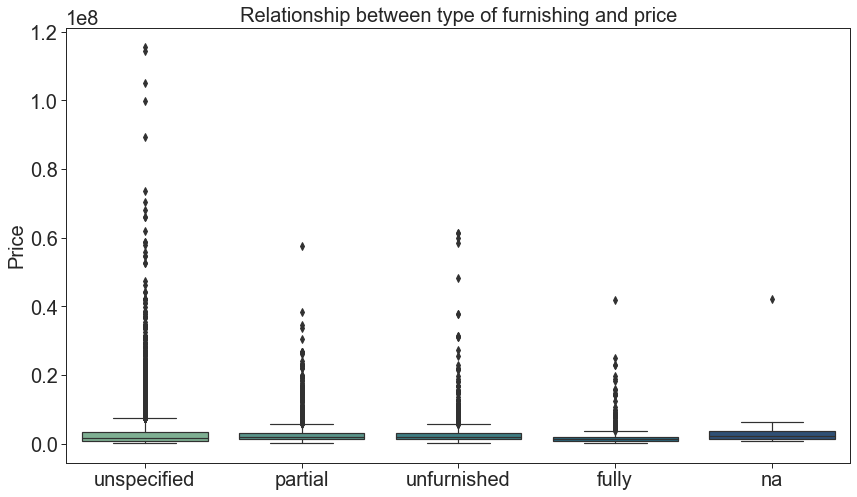

In [250]:
fig, ax = plt.subplots(figsize=(12,7))
sns.boxplot(x="furnishing", y="price", data=df_train_cleaned, palette="crest")
ax.set_xlabel("")
ax.set_ylabel("Price")
ax.set_title("Relationship between type of furnishing and price")
save_fig("furnishing_price", img_dir)
plt.show()


- The type of furnishing does not seem to have any clear pattern hence may not be useful for our model prediction

### Relationship between total number of units and prices

Saving figure total_units_price


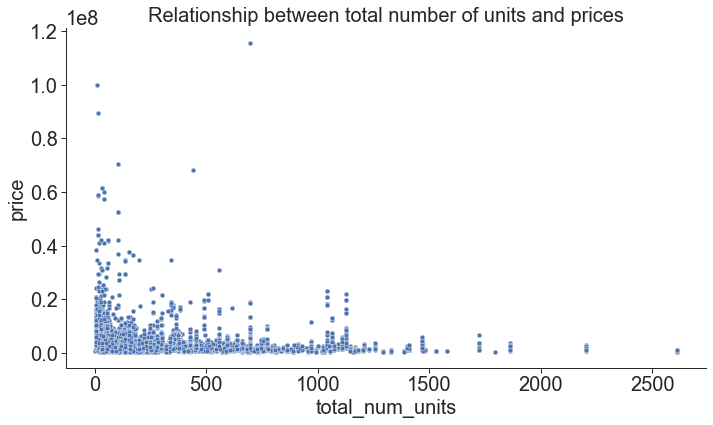

In [251]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="total_num_units", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between total number of units and prices")
save_fig("total_units_price", img_dir)
plt.show()


### Remove Duplicates

In [252]:
df_train_cleaned = df_train_cleaned.drop_duplicates(keep="first")

In [253]:
check_shape(df_train_cleaned)

There are 20096 data points and 21 features


## 4.4 Auxiliary Data

### Subzone

- We can compute the density of the planning area by taking the total population of the subzone divided by the area size

In [254]:
df_subzone.head()

,name,area_size,population,planning_area
0,ang mo kio town centre,0.3169,4810,ang mo kio
1,cheng san,0.9557,28070,ang mo kio
2,chong boon,1.0786,26500,ang mo kio
3,kebun bahru,1.0464,22620,ang mo kio
4,sembawang hills,0.8945,6850,ang mo kio


In [255]:
df_subzone["density"] = df_subzone["population"]/df_subzone["area_size"]

In [256]:
dict_subzone_density = df_subzone.groupby("planning_area")["density"].mean().to_dict()
# save dictionary for preprocessing step
with open("../clean_data/dict_subzone_density.pkl", "wb") as f:
    pickle.dump(dict_subzone_density, f)

### Distance to MRT

- We can also compute the distance to the nearest MRT. This should be a useful feature as units near MRT stations tend to fetch a higher price due to convenience.

In [257]:
df_data_cleaned_coord = df_train_cleaned.loc[:,["lat", "lng"]]
df_mrt_coord = df_mrt.loc[:,["name", "lat", "lng"]]

In [258]:
df_data_cleaned_coord = df_data_cleaned_coord.drop_duplicates()

In [259]:
mrt_coord = list(zip(df_mrt["lat"], df_mrt["lng"]))
data_coord = list(zip(df_data_cleaned_coord["lat"], df_data_cleaned_coord["lng"]))

In [260]:
def calc_distance(from_loc, to_lat, to_long):
    return distance.distance(from_loc, (to_lat, to_long))

In [261]:
df_data_mrt_cross = df_data_cleaned_coord.merge(df_mrt_coord, how="cross")

- The calculation takes about 5 mins so we saved the file to save time

In [262]:
#df_data_mrt_cross["distance"] = df_data_mrt_cross.apply(lambda row: calc_distance((row.lat_x, row.lng_x), row.lat_y, row.lng_y), axis=1)
#df_min_dist_mrt.to_csv("clean_data/coord_min_dist_mrt.csv")

In [263]:
df_data_mrt_cross = pd.read_csv("../clean_data/coord_min_dist_mrt.csv", index_col=0)

In [264]:
df_min_dist_mrt = df_data_mrt_cross.groupby(["lat_x", "lng_x"])["distance"].min().reset_index()

In [265]:
# performing some preprocessing to that we can get the distance as float value
df_train_cleaned["lat"] = df_train_cleaned["lat"].astype(float)
df_train_cleaned["lng"] = df_train_cleaned["lng"].astype(float)
df_min_dist_mrt["distance"] = df_min_dist_mrt["distance"].astype(str)
df_min_dist_mrt["distance"] = df_min_dist_mrt["distance"].apply(lambda x: x.replace("km" ,""))
df_min_dist_mrt["distance"] = df_min_dist_mrt["distance"].astype(float)

In [266]:
df_train_cleaned_temp = df_train_cleaned.copy()

In [267]:
# map back to original dataframe
df_train_cleaned_temp = df_train_cleaned_temp.merge(df_min_dist_mrt, left_on=["lat", "lng"], right_on=["lat_x", "lng_x"], how="left")

In [268]:
df_train_cleaned_temp = df_train_cleaned_temp.drop(["lat_x", "lng_x"],axis=1)

Saving figure axus_mrt_price


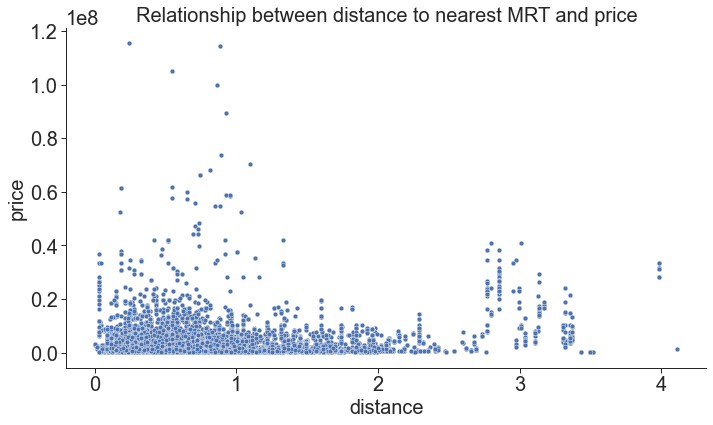

In [269]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="distance", y="price",
                data=df_train_cleaned_temp, ax=ax)
plt.title("Relationship between distance to nearest MRT and price")
save_fig("axus_mrt_price", img_dir)
plt.show()

### Shopping Malls

- The number of shopping malls in a planning area should also be an important feature since having more amenities translates into convenience.

In [270]:
dict_shopping_area = df_shopping.groupby("planning_area")["planning_area"].count().to_dict()

In [271]:
# save dictionary for preprocessing step
with open("../clean_data/dict_shopping_area.pkl", "wb") as f:
    pickle.dump(dict_shopping_area, f)

In [272]:
# create a temp so that we can apply the "create_features" function separately later in the preprocessing step
df_train_cleaned_temp = df_train_cleaned.copy()
df_train_cleaned_temp["num_shopping_malls"] = df_train_cleaned_temp["planning_area"].map(dict_shopping_area)

Saving figure aux_shopping_area


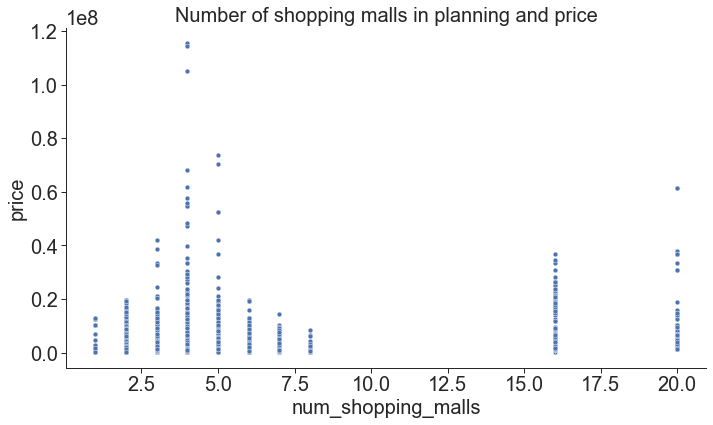

In [273]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="num_shopping_malls", y="price",
                data=df_train_cleaned_temp, ax=ax)
plt.title("Number of shopping malls in planning and price")
save_fig("aux_shopping_area", img_dir)
plt.show()

## Create Dictionary

In [274]:
dict_property_price = df_train_cleaned.groupby("property_type")["price"].mean().to_dict()
with open("../clean_data/dict_property_price.pkl", "wb") as f:
        pickle.dump(dict_property_price, f)
        
dict_target_encode = df_train_cleaned.groupby(["planning_area"])["price"].mean().to_dict()
with open("../clean_data/dict_target_encode.pkl", "wb") as f:
    pickle.dump(dict_target_encode, f)
    
dict_subzone_price = df_train_cleaned.groupby(["subzone"])["price"].mean().to_dict()
with open("../clean_data/dict_subzone_price.pkl", "wb") as f:
    pickle.dump(dict_subzone_price, f)
    
dict_subzone_sqft = df_train_cleaned.groupby(["subzone"])["size_sqft"].mean().to_dict()
with open("../clean_data/dict_subzone_sqft.pkl", "wb") as f:
    pickle.dump(dict_subzone_sqft, f)
    
dict_property_sqft= df_train_cleaned.groupby(["property_type"])["size_sqft"].mean().to_dict()
with open("../clean_data/dict_property_sqft.pkl", "wb") as f:
    pickle.dump(dict_property_sqft, f)
    
dict_planning_sqft = df_train_cleaned.groupby(["planning_area"])["size_sqft"].mean().to_dict()
with open("../clean_data/dict_planning_sqft.pkl", "wb") as f:
    pickle.dump(dict_planning_sqft, f)


## 4.5 Missing Value

In [275]:
df_train_cleaned_missing = df_train_cleaned.copy()

Saving figure missing_value


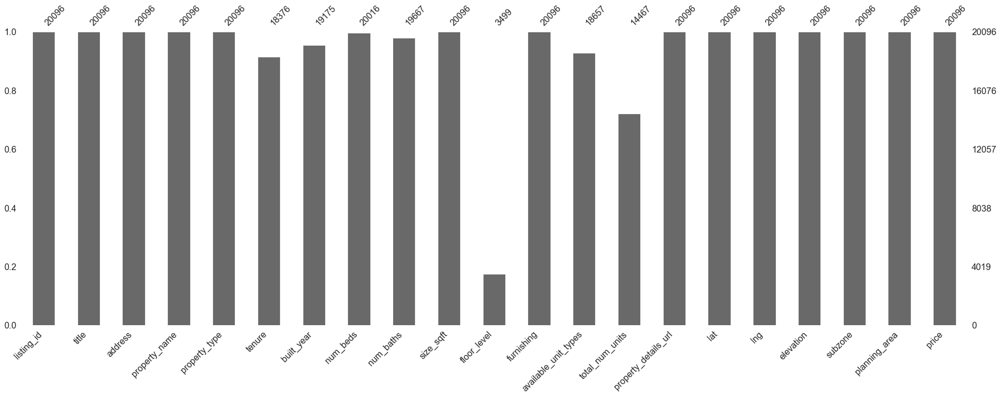

In [276]:
msno.bar(df_train_cleaned_missing)
save_fig("missing_value", img_dir)

In [277]:
missing_values_table(df_train_cleaned_missing)

Your selected dataframe has 21 columns.
There are 7 columns that have missing values.


,Missing Values,% of Total Values
floor_level,16597,82.6
total_num_units,5629,28.0
tenure,1720,8.6
available_unit_types,1439,7.2
built_year,921,4.6
num_baths,429,2.1
num_beds,80,0.4


####  Handling missing values

- We will drop ``floor_level`` as there are too many missing values (79%!)
- We will also drop ``furnishing`` and ``available_unit_types`` as they don't contribute to the prediction of prices.
- For ``tenure``, we can infer from the property type. We know that HDB has a tenure of 99 years so we can impute this information to our data
- For the remaining missing ``tenure`` for non-hdb, we shall impute the most occuring ``tenure`` value by ``property_type``.We will save this file so that we can apply it on our test set
- For ``num_beds`` and ``num_baths``, we will get the most commonly occuring value according to ``property_type``. Similarly, we will save this file so that we can apply it on our test set.
- For missing ``built_year``, we can take the median of built year according to the subzone. Our hypothesis is that buildings in a subzone are usually built together. It is of course a naive assumption but should give a 
- If there are still missing ``built_year``, then it could mean that the subzone was newly formed. Hence, we will impute the current year 

In [278]:
def yes_handling_missing_values(data):
    
    data = data.drop(["floor_level" , "furnishing", "available_unit_types"], axis=1)
    
    ############
    ## Tenure ##
    ############
    # fill missing tenure using property_type
    lease_hdb = ["hdb", "hdb executive"]
    data["tenure"] = data["tenure"].fillna(pd.Series(np.where((data["property_type"].isin(lease_hdb)), "99-year leasehold", pd.NA )))
    
    dict_tenure = data.groupby(["property_type"])["tenure"].apply(lambda x: x.value_counts().index[0]).to_dict()
    data["tenure"] = data["tenure"].fillna(data["property_type"].map(dict_tenure))
    
    # save dictionary for preprocessing step
    with open("../clean_data/dict_tenure.pkl", "wb") as f:
        pickle.dump(dict_tenure, f)
    
    #################
    ## Beds, Baths ##
    #################
    # fill number of bedroom and bathroom using mean number of same property
    property_bed_bath_group = data.groupby(["property_type", "num_baths", "num_beds"]).size().reset_index()
    property_bed_bath_group.columns.values[property_bed_bath_group.columns == 0] = "count"
    # most common num_baths, num_beds according to property_type
    idx = property_bed_bath_group.groupby(["property_type"])["count"].transform(max) == property_bed_bath_group["count"]
    property_bed_bath_group = property_bed_bath_group[idx]
    # if there are multiple property_type with same count of num_baths and num_beds, then take the first one.
    property_bed_bath_group = property_bed_bath_group.drop_duplicates(subset=["property_type"], keep="first").drop("count", axis=1)
    
    # save to dictionary
    dict_bed_bath = property_bed_bath_group.set_index("property_type").T.to_dict("records")
    # save dictionary for preprocessing step
    # num_baths [0] and num_beds [1] entry in dictionary
    with open("../clean_data/dict_bed_bath.pkl", "wb") as f:
        pickle.dump(dict_bed_bath, f)

    data["num_baths"] = data["num_baths"].fillna(data["property_type"].map(dict_bed_bath[0]))
    data["num_beds"] = data["num_beds"].fillna(data["property_type"].map(dict_bed_bath[1]))
    
    ################
    ## Built Year ##
    ################
    # take median built_year of each subzone
    dict_built_year_subzone = data.groupby(["subzone"])["built_year"].mean().to_dict()
    with open("../clean_data/dict_built_year_subzone.pkl", "wb") as f:
        pickle.dump(dict_built_year_subzone, f)
        
    data["built_year"] = data["built_year"].fillna(data["subzone"].map(dict_built_year_subzone))
    
    # if there are still missing built_year, then we will fill it with current year 2022 since it could
    # very likely be a newly formed subzone.
        
    data["built_year"] = data["built_year"].fillna(2022)
    
    # round to integer
    data["built_year"] = data["built_year"].apply(lambda x: round(x))
    ###########################
    ## Total Number of Units ##
    ###########################
    data["total_num_units"] = data["total_num_units"].fillna(data["total_num_units"].mean())
     # round to integer
    data["total_num_units"]  = data["total_num_units"] .apply(lambda x: round(x))
    
    
    
    return data


In [279]:
df_train_no_missing = yes_handling_missing_values(df_train_cleaned_missing)

In [280]:
missing_values_table(df_train_no_missing)

Your selected dataframe has 18 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [282]:
df_train_no_missing.to_csv("../clean_data/df_train_eda.csv")

In [283]:
df_train_no_missing.head()

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb,99-year leasehold,1988,3.0,2.0,1115,116,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992,4.0,2.0,1575,375,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0
2,665422,4 bed condo for sale in meyerhouse,128 meyer road,meyerhouse,condo,freehold,2022,4.0,6.0,3070,56,https://www.99.co/singapore/condos-apartments/...,1.298773,103.895798,0,mountbatten,marine parade,8485000.0
3,857699,3 bed condo for sale in leedon green,26 leedon heights,leedon green,condo,freehold,2023,3.0,2.0,958,638,https://www.99.co/singapore/condos-apartments/...,1.312364,103.803271,0,farrer court,bukit timah,2626000.0
4,216061,2 bed condo for sale in one bernam,1 bernam street,one bernam,condo,99-year leasehold,2026,2.0,1.0,732,351,https://www.99.co/singapore/condos-apartments/...,1.273959,103.843635,0,anson,downtown core,1764000.0
